In [1]:
import pandas as pd
import scanpy as sc
import squidpy as sq
import numpy as np
from sklearn.linear_model import ElasticNet
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import anndata as ad

from bin import load_bgi
from bin import SCC
from bin import GraphCluster

In [2]:
cdata = load_bgi.load_bin(gem_file="gRNA/B924/cut.combined.D03658A3.merged.sgRNA.gem.bin_100",
                        bin_size=1,
                        library_id="gRNA")
cdata

AnnData object with n_obs × n_vars = 20596 × 26810
    obsm: 'spatial'

In [3]:
sg_genes = [gene for gene in cdata.var_names if gene.startswith('sg')]
gdata = cdata[:, sg_genes].copy()

sgs = gdata.var_names.str.split('_', n=1).str[0]
sgs_grouped = pd.DataFrame(gdata.X.toarray(), columns=gdata.var_names)
sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()
sgdata = ad.AnnData(sgs_grouped, obs=gdata.obs, var=pd.DataFrame(index=sgs_grouped.columns))
sgdata.obsm['spatial'] = gdata.obsm['spatial']
sgdata

AnnData object with n_obs × n_vars = 20596 × 34
    obsm: 'spatial'

In [14]:
non_sg_genes = [gene for gene in cdata.var_names if not gene.startswith('sg')]
rnadata = cdata[:, non_sg_genes].copy()
rnadata

AnnData object with n_obs × n_vars = 20596 × 26742
    obsm: 'spatial'

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:233: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


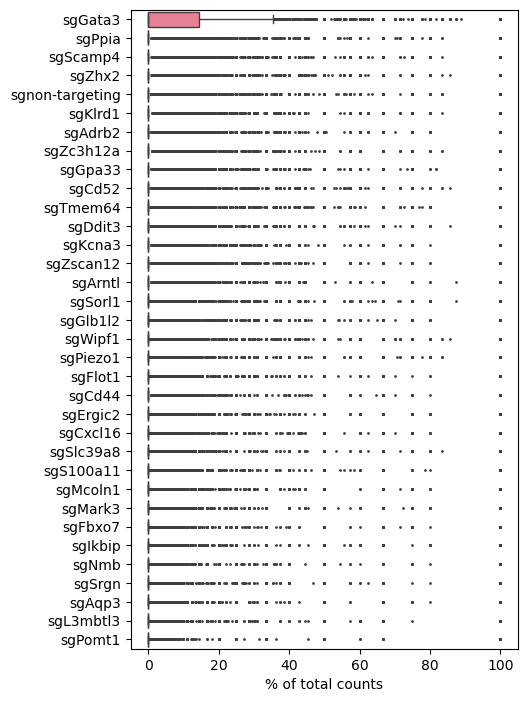

In [20]:
sc.pl.highest_expr_genes(sgdata, n_top=34, )

In [24]:
rnadata.var["mt"] = rnadata.var_names.str.startswith("mt-")
rnadata.var["Rb"] = rnadata.var_names.str.startswith("Rp")
fdata = rnadata[:, ~rnadata.var["mt"]].copy()
fdata = fdata[:, ~fdata.var["Rb"]]

sc.pp.calculate_qc_metrics(fdata,percent_top=None, log1p=False, inplace=True)
sc.pp.filter_cells(fdata, min_genes=1000)
sc.pp.filter_cells(fdata, min_counts=2000)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_qc.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


In [25]:
sc.pp.normalize_total(fdata)
sc.pp.log1p(fdata)
sc.pp.pca(fdata)

In [26]:
with open("./He2020Nature_mouseHK.txt", 'r') as f:
    for line in f:
        hk_genes = line.split('\t')
        break

In [27]:
hk_genes

['Gnai3',
 'Fer',
 'Tfe3',
 'Brat1',
 'Gpr107',
 'Rtca',
 'Dazap2',
 'Ccm2',
 'Ndufa9',
 'Mkrn2',
 'Raf1',
 'Wdr77',
 'Atp5f1',
 'C1d',
 'Krit1',
 'Rab5b',
 'Spg7',
 'Chmp1a',
 'Tubgcp3',
 'Polr3d',
 'Ddx3x',
 'Tpd52l2',
 'Fmr1',
 'Gnb1l',
 'Nsun5',
 'Oxa1l',
 'Chtop',
 'Snapin',
 'Sec24b',
 'Rmnd5b',
 'Zfp276',
 'Mfsd10',
 'Poldip2',
 'Ift20',
 'Snrnp27',
 'Dpp9',
 'Myg1',
 'Pfdn5',
 'Hars',
 'Zmat2',
 'Cct3',
 'Mrpl10',
 'Def8',
 'Itfg2',
 'Nom1',
 'Ergic1',
 'Ifrd1',
 'Coasy',
 'Crnkl1',
 'Rtcb',
 'Pwp1',
 'Clpb',
 'Sept7',
 'Zdhhc4',
 'Rac1',
 'Nup214',
 'Trmt1',
 'Siae',
 'Fam50a',
 'Emd',
 'Taco1',
 'Ap4e1',
 'Idh3g',
 'Sdf2',
 'Psmc3',
 'Acp2',
 'Vrk3',
 'Smg9',
 'Lmf1',
 'Narfl',
 'Daxx',
 'Tm9sf1',
 'Gmpr2',
 'Mdp1',
 '2310045N01Rik',
 'Ranbp3',
 'Use1',
 'Hltf',
 'Prpf6',
 'Puf60',
 'Golga2',
 'Uck1',
 'Ccdc97',
 'Pdcd2l',
 'Gtf2f1',
 'Clpp',
 'Alkbh7',
 'Med6',
 'Naa20',
 'Pex6',
 'Mrpl2',
 'Mea1',
 'Flii',
 'Qtrt1',
 'Adprh',
 'Timmdc1',
 'Tpra1',
 'Map2k7',
 'Timm44',
 'Ap

In [28]:
tdata = fdata[:, [gene for gene in fdata.var_names if gene not in hk_genes]]

In [30]:
tdata.write_h5ad("./RNA/D03658A3.filtered_hk.bin_100.h5")

In [23]:
tdata = ad.read_h5ad("./RNA/D03658A3.filtered_hk.bin_100.h5")

In [31]:
tdata

View of AnnData object with n_obs × n_vars = 20093 × 23786
    obs: 'n_genes_by_counts', 'total_counts', 'n_genes', 'n_counts'
    var: 'mt', 'Rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', 'pca'
    obsm: 'spatial', 'X_pca'
    varm: 'PCs'

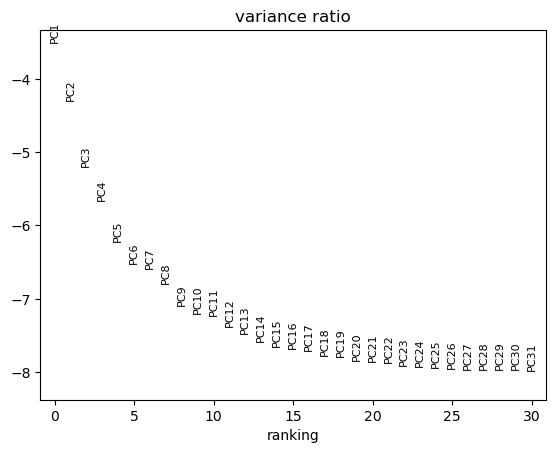

In [32]:
sc.pl.pca_variance_ratio(tdata, log=True)

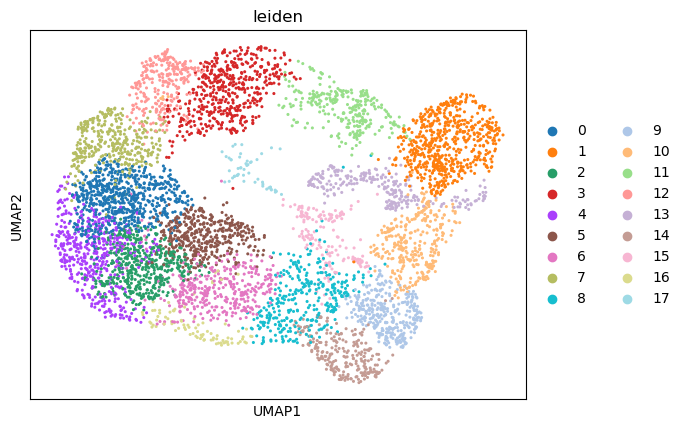

In [329]:
sc.pp.neighbors(tdata, n_neighbors=10, n_pcs=40)
sc.tl.umap(tdata)
sc.tl.leiden(tdata)
sc.pl.umap(tdata, color=['leiden'])

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


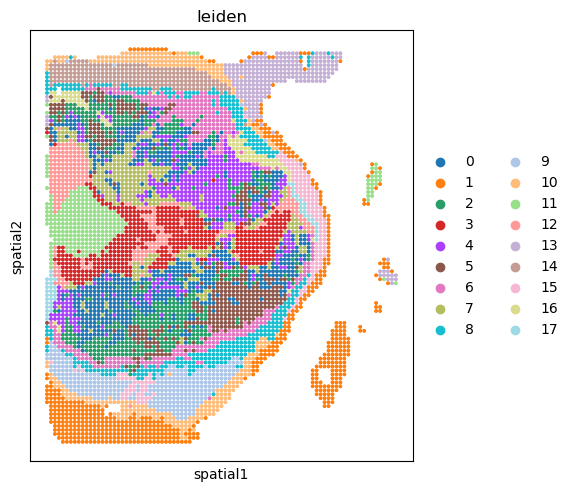

In [330]:
sq.pl.spatial_scatter(tdata, color=["leiden"], size=10, shape=None)

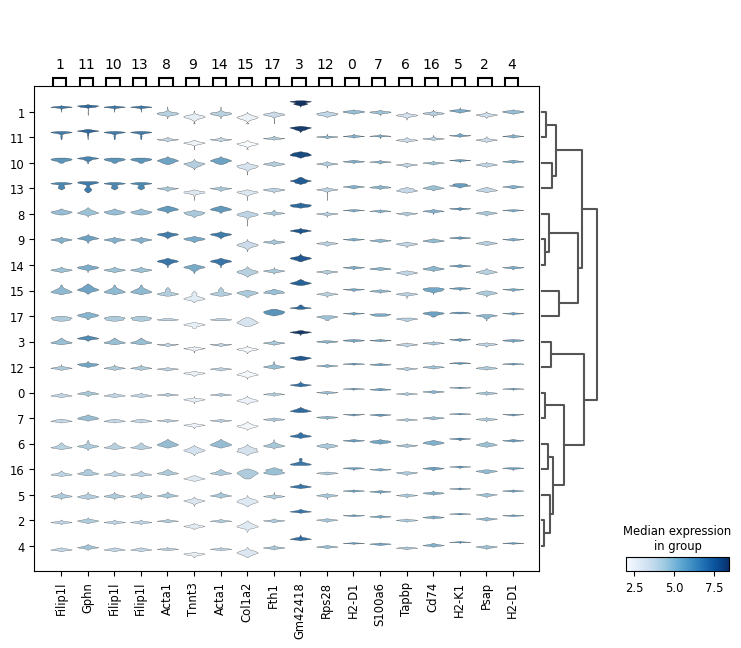

In [408]:
sc.tl.rank_genes_groups(tdata, groupby="leiden", method="t-test")
sc.pl.rank_genes_groups_stacked_violin(tdata, n_genes=1)

In [9]:
pval_cutoff = 0.01
top_n = 5

result = tdata.uns['rank_genes_groups']
groups = result['names'].dtype.names  # 获取所有聚类的名字

# 创建一个空的DataFrame用来存储结果
top_genes_df = pd.DataFrame()

for group in groups:
    # 提取每个聚类的基因名称、Log2FC、padj
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    
    # 将它们转换为DataFrame
    data = pd.DataFrame({
        'Gene': genes,
        'Log2FoldChange': log2fc,
        'padj': padj
    })
    
    # 筛选出padj > 0.01的基因
    filtered_data = data[data['padj'] < 0.01]
    
    # 按Log2FoldChange降序排序
    sorted_data = filtered_data.sort_values(by='Log2FoldChange', ascending=False)
    
    # 选取排序前10的基因
    top_genes = sorted_data.head(top_n)
    
    # 添加聚类信息
    top_genes['Cluster'] = group
    
    # 将当前聚类的结果追加到总的DataFrame中
    top_genes_df = pd.concat([top_genes_df, top_genes], ignore_index=True)

deg = top_genes_df["Gene"].unique().tolist()

KeyError: 'rank_genes_groups'

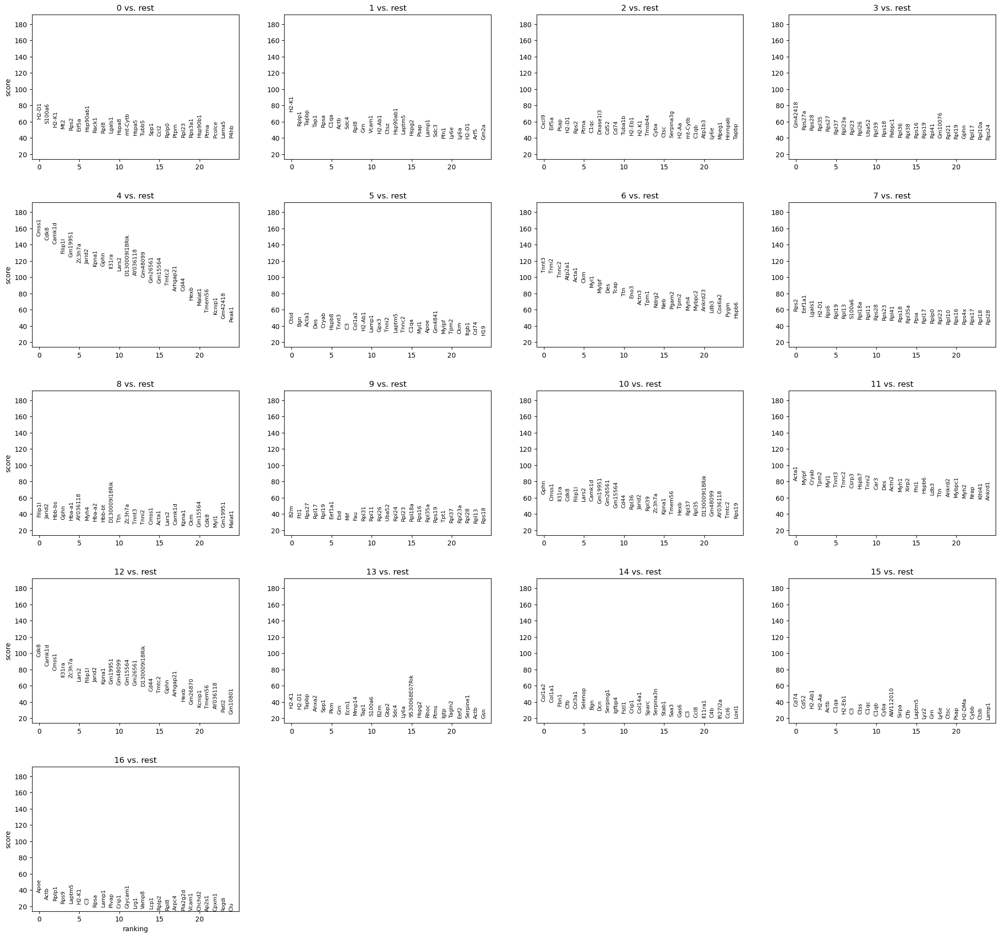

In [65]:
sc.pl.rank_genes_groups(tdata, n_genes=25)

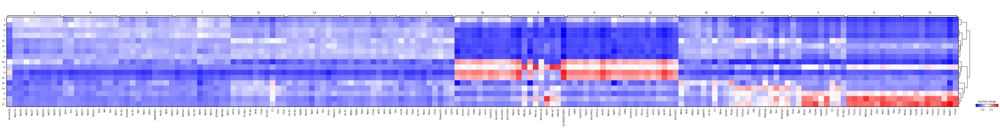

In [101]:
sc.pl.rank_genes_groups_matrixplot(tdata, n_genes=10, cmap='bwr', groupby="leiden", values_to_plot="logfoldchanges")

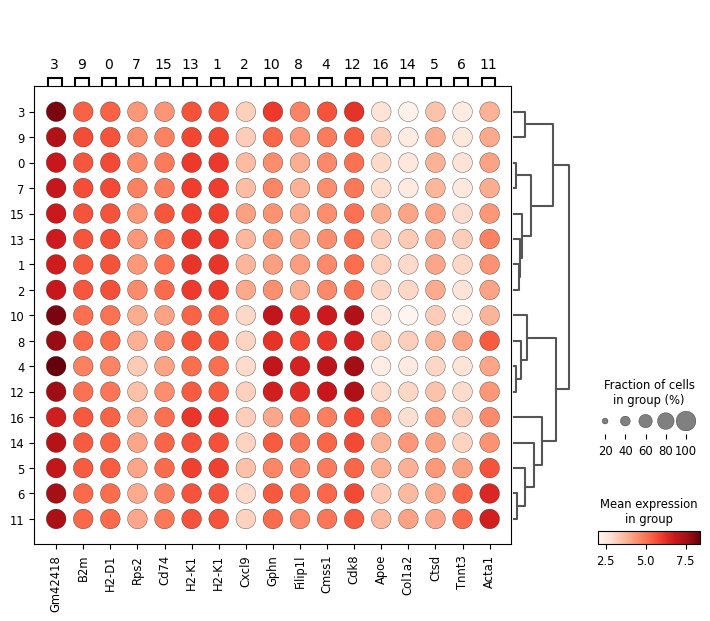

In [66]:
sc.pl.rank_genes_groups_dotplot(tdata, n_genes=1)

In [318]:
tdata

AnnData object with n_obs × n_vars = 6159 × 24509
    obs: 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts', 'leiden', 'hdc'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'hdc_colors'
    obsm: 'X_pca', 'spatial', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

0.681463


/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


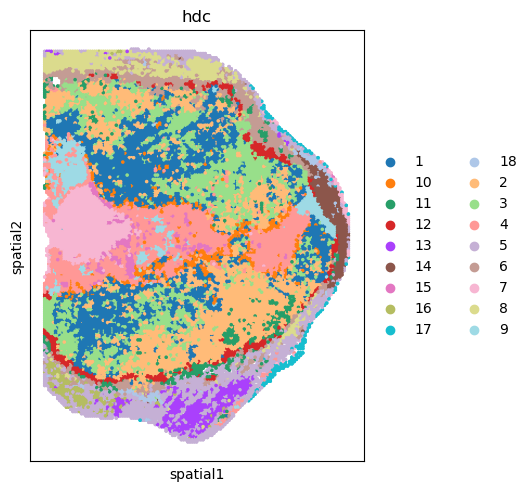

In [43]:
hdata = tdata.copy()
GraphCluster.hdc(hdata, leaf_size=5, num_neighbors=100, neighbor_b=-1)
sq.pl.spatial_scatter(hdata, color=["hdc"], size=10, shape=None)

In [44]:
sc.tl.rank_genes_groups(hdata, groupby="hdc", method="t-test")

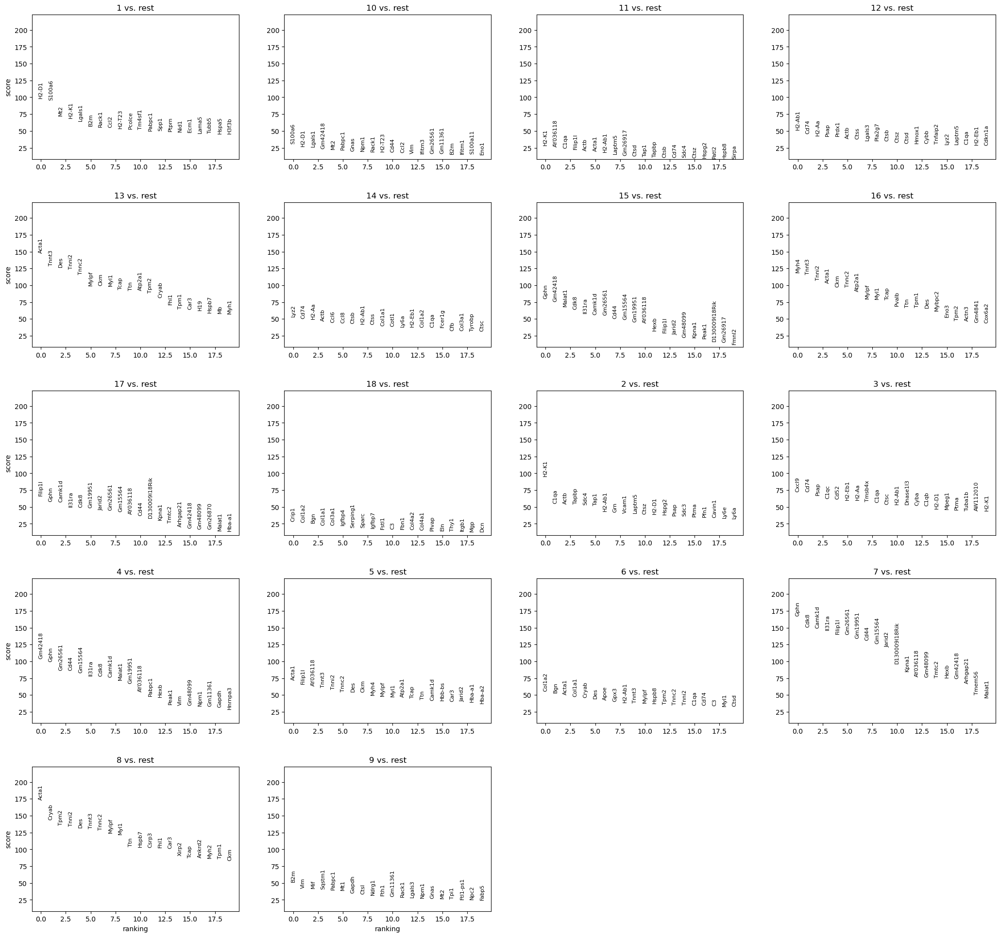

In [45]:
sc.pl.rank_genes_groups(hdata, groupby="hdc", n_genes=20)

In [ ]:
# adipogenesis ['Adipoq', 'Retn', 'Gphn']
# allograft_rejection ['Nos2']
# apical_junction ['Cadm3', 'Vcam1', 'Actc1']
# apoptosis ['Cd14']
# coagulation ['F10', 'Mmp8']
# complement ['F10', 'Mmp8']
# epithelial_mesenchymal_transition ['Vcam1']
# estrogen_response_early ['Zfp185']
# estrogen_response_late ['Perp']
# fatty_acid_metabolism ['Inmt']
# glycolysis ['Eno1b']
# heme_metabolism ['Alas2']
# hypoxia ['Pygm', 'Eno1b', 'Pck1']
# il2_stat5_signaling ['Csf2']
# il6_jak_stat3_signaling ['Csf2', 'Cd14', 'Cxcl2']
# inflammatory_response ['Lamp3', 'Cd14', 'Csf3']
# interferon_alpha_response ['Lamp3']
# interferon_gamma_response ['Vcam1']
# kras_signaling_dn ['Myh7', 'Chrng', 'Gdnf', 'Actc1']
# kras_signaling_up ['Csf2', 'F13a1', 'Retn']
# mtorc1_signaling ['Eno1b']
# myogenesis ['Kcnh1', 'Myh7', 'Myl3', 'Atp2a1', 'Myh4', 'Pvalb', 'Pygm', 'Chrng', 'Myh3', 'Actc1', 'Myh2', 'Ankrd2', 'Myh1', 'Cryab', 'Csrp3', 'Fhl1']
# notch_signaling ['Dtx1', 'Heyl']
# p53_pathway ['Perp']
# pancreas_beta_cells ['Insm1']
# tnfa_signaling_via_nfkb ['Csf2', 'Cxcl2', 'Dusp4']
# xenobiotic_metabolism ['F10']

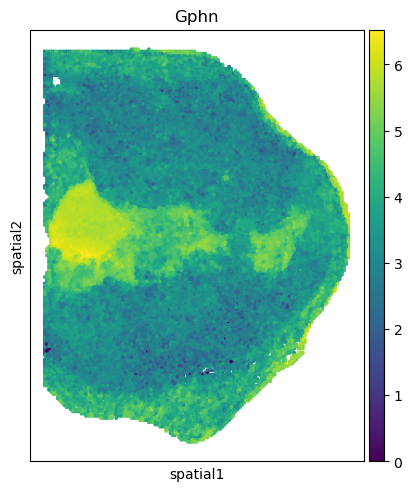

In [42]:
sq.pl.spatial_scatter(hdata, color=["Gphn"], size=10, shape=None)

In [25]:
pval_cutoff = 0.01
top_n = 50

result = hdata.uns['rank_genes_groups']
groups = result['names'].dtype.names  # 获取所有聚类的名字

# 创建一个空的DataFrame用来存储结果
top_genes_df = pd.DataFrame()

for group in groups:
    # 提取每个聚类的基因名称、Log2FC、padj
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    
    # 将它们转换为DataFrame
    data = pd.DataFrame({
        'Gene': genes,
        'Log2FoldChange': log2fc,
        'padj': padj
    })
    
    # 筛选出padj > 0.01的基因
    filtered_data = data[data['padj'] < 0.01]
    
    # 按Log2FoldChange降序排序
    sorted_data = filtered_data.sort_values(by='Log2FoldChange', ascending=False)
    
    # 选取排序前10的基因
    top_genes = sorted_data.head(top_n)
    
    # 添加聚类信息
    top_genes['Cluster'] = group
    
    # 将当前聚类的结果追加到总的DataFrame中
    top_genes_df = pd.concat([top_genes_df, top_genes], ignore_index=True)

deg = top_genes_df["Gene"].unique().tolist()
top_genes_df.to_csv("./DEG.txt", index=None, sep="\t")

/tmp/ipykernel_47434/1843337437.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_genes['Cluster'] = group
/tmp/ipykernel_47434/1843337437.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_genes['Cluster'] = group
/tmp/ipykernel_47434/1843337437.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

In [7]:
Tex = ['Havcr2', 'Lag3', 'Pdcd1', 'Entpd1', 'Tigit', 'Ctla4', 'Layn']
Macrophages = ["Ptprc", "Cd14", "Itgam", "Itgax", "Trem2", "Fcgr3a", "Fcgr3b", "Ccr2", "Cd163", "Cd68", "Arg1", "Adgre1", "Cd33", "Cd68", "C1qa", "Cd163",  "C1qb", "C1qc",  "Marco", "Cd81"]
DC = ["Ptprc", "Itgam", "Itgax", "Cd14", "Cd33", "Cd68", "Cd1c", "Cd209", "Ccl22", "Cd86", "Clec9a", "Clec10a", "Xcr1", "Lamp3"]
Endothelial = ["Vwf", "Pecam1", "Cldn5","Cdh5", "Mgp"]
Fibroblasts = ["Col1a1", "Col1a2", "Col3a1","Mmp2", "Myl9", "Dcn","Fap"]
NK = ["Ptprc", "Klrd1", "Mrpl47", "Ncr1", "NkG7", "Gnly", "Klrk1", "Klrc1", "Gzmb", "Klrf1"]
T = ["Ptprc", "Cd3d", "Cd3g", "Cd3e", "Cd8a", "Cd4", "Trbc1","Trbc2","Trac","Gnly", "Klrg1", "Gzmb", "Prf1", "Gzmk", "Ccr7", "Il7r", "Sell", "Lef1", "Tcf7", "Lag3", "Layn", "Havcr2", "Ctla4", "Ggt1", "Tigit", "Cd160", "Tox", "Prdm1", "Socs1", "Eomes", "Tbx21", "Batf", "Foxo1", "Cd4", "Foxp3", "Gata3", "Tbx21", "Cxcr3", "Cd8b"]
B = ["Ptprc", "Cd19", "Tnfrsf17", "Cd79a", "Cd79b", "Slamf7", "Igkc", "Ms4a1"]
Plasma = ["Cd79a", "Mzb1", "Jchain", "Igha1", "Ighg1", "Mki67"]
Neutrophils = ["Ptprc", "S100a9", "Mpo", "Cxcr2", "Csf3r", "Aqp9"]
Malignant = ["Mki67", "Epcam", "Top2a", "Ascl2", "Cbx3", "Hsp90ab1", "Zfas1", "Pabpc1", "Gtf3a", "Nap1l1", "Tgfbi", "Ifitm3", "Hspd1", "Nono", "Hsph1", "Nkd1", "Ly6e", "C6orf48", "Ssb", "Rsl1d1", "Dpep1", "Dkc1", "Bmp4", "Gng4", "Cpne1", "Zdhhc9", "Dars", "Scd", "Myc", "Phlda1", "Dach1", "Cldn1", "Krt23"]
MAST = ["Tpsab1", "Kit"]
Epithelial = ["Cdh1", "Epcam", "Cdkn2a", "Krt5", "Krt17", "Muc5b"]
Hepatocytes = ["Alb","Apoa1","Afp","Tf","Apom","Asgr1","Pck1","Ass1", "Hamp", "Pck1", "Ttrdefb1"]
SmoothMuscle = ["Acta2", "My19", "Myh11", "Mylk","Tagln","Mcam","Actg2","Mgp","Des","Tmp1"]

hallmark_file = open("./GO/mh.all.v2023.2.Mm.symbols.gmt", 'r')
data = []
for line in hallmark_file:
    parts = line.strip().split('\t')
    hallmark = parts[0]
    genes = parts[2:]

    for gene in genes:
        data.append([hallmark, gene])

hallmark_df = pd.DataFrame(data, columns=['Hallmark', 'Gene'])
hallmark_df['Hallmark'] = [mark.lstrip('HALLMARK')[1:].lower() for mark in hallmark_df['Hallmark']]
hallmarks = np.unique(hallmark_df['Hallmark'])

In [11]:
marks = {}
for interest in hallmarks:
    pathway = hallmark_df.loc[hallmark_df['Hallmark'] == f"{interest}", 'Gene']
    d = [gene for gene in deg if np.sum(np.isin(pathway, gene))]
    marks[interest] = d
    # if len(d) > 0: print(interest, d)
marks["t_exhaustion"] = [gene for gene in deg if np.sum(np.isin(Tex, gene))]
marks["macrophages"] = [gene for gene in deg if np.sum(np.isin(Macrophages, gene))]
marks["fibroblasts"] = [gene for gene in deg if np.sum(np.isin(Fibroblasts, gene))]
marks["dentritic"] = [gene for gene in deg if np.sum(np.isin(DC, gene))]
marks["endothelial"] = [gene for gene in deg if np.sum(np.isin(Endothelial, gene))]
marks["natural_killing"] = [gene for gene in deg if np.sum(np.isin(NK, gene))]
marks["t"] = [gene for gene in deg if np.sum(np.isin(T, gene))]
marks["b"] = [gene for gene in deg if np.sum(np.isin(B, gene))]
marks["maglinant"] = [gene for gene in deg if np.sum(np.isin(Malignant, gene))]
marks["plasma"] = [gene for gene in deg if np.sum(np.isin(Plasma, gene))]
marks["neutrophils"] = [gene for gene in deg if np.sum(np.isin(Neutrophils, gene))]
marks["mast"] = [gene for gene in deg if np.sum(np.isin(MAST, gene))]
marks["epithelial"] = [gene for gene in deg if np.sum(np.isin(Epithelial, gene))]
marks["hepatocytes"] = [gene for gene in deg if np.sum(np.isin(Hepatocytes, gene))]
marks["smooth_muscle"] = [gene for gene in deg if np.sum(np.isin(SmoothMuscle, gene))]
for path, genes in marks.items():
   if len(genes) > 0:
       print(path, genes)
       sc.tl.score_genes(hdata, gene_list=genes, score_name=f"{path}_score")
#        sq.pl.spatial_scatter(hdata, color=[f"{path}_score"], size=10, shape=None, library_id="gRNA")

adipogenesis ['Hspb8', 'Apoe', 'Abca1', 'Mrap', 'Gphn', 'Adipoq', 'Sncg', 'Retn', 'Gadd45a']
allograft_rejection ['Il11', 'Nos2', 'Ccl22', 'Il1b', 'Inhba', 'Ccl5', 'Tnf', 'Prf1', 'Il12rb1', 'Tap2', 'Gzmb', 'Cd8a', 'Cxcl9', 'Il2rb', 'Cd96']
androgen_response ['Krt19', 'Cdc14b', 'Steap4', 'Ndrg1']
angiogenesis ['Nrp1', 'Cxcl5', 'Pglyrp1', 'Vegfa']
apical_junction ['Actg1', 'Acta1', 'Sirpa', 'Cadm3', 'Adamts5', 'Actn3', 'Cdk8', 'Actg2', 'Itgb4', 'Pard6g', 'Myl9', 'Vcam1', 'Sdc3', 'Actc1', 'Cdh15', 'Nrap', 'Actn2']
apical_surface ['Il2rb']
apoptosis ['Isg20', 'Btg3', 'Cd14', 'Hmox1', 'Il1b', 'Tnf', 'Sod2', 'Cd44', 'Prf1', 'Gadd45a']
bile_acid_metabolism ['Acsl1', 'Abca1', 'Nr3c2']
cholesterol_homeostasis ['Actg1', 'Fabp5']
coagulation ['C1qa', 'F10', 'Mmp8', 'Cfd', 'A2m', 'Comp', 'Mmp10']
complement ['Cp', 'C1qa', 'Ctsd', 'F10', 'Mmp12', 'Mmp8', 'F7', 'Ccl5', 'Mt3', 'Gzmb', 'Kynu', 'Actn2', 'S100a9']
epithelial_mesenchymal_transition ['Edil3', 'Col1a2', 'Gpc1', 'Inhba', 'Ptx3', 'Cxcl5', 'N

In [64]:
hdata.write_h5ad("./RNA/D03658A3.filtered_hk.pathway.bin_100.h5")

In [4]:
hdata = ad.read_h5ad("./RNA/D03658A3.filtered_hk.pathway.bin_100.h5")

In [48]:
import gseapy as gp

enr = gp.enrich(gene_list=deg, gene_sets=["GO_Biological_Process_2023"])
gp.barplot(enr.res2d, title='GO Enrichment Analysis', cutoff=10)

go_term = 'GO:0050868'
go_genes = []
for term in enr.results.iterrows():
    if term[1]['Term'] == go_term:
        go_genes = term[1]['Genes'].split(';')
        break
go_genes

ConnectionError: HTTPConnectionPool(host='maayanlab.cloud', port=80): Max retries exceeded with url: /Enrichr/datasetStatistics (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fc93884ac60>: Failed to establish a new connection: [Errno 113] No route to host'))

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:190: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


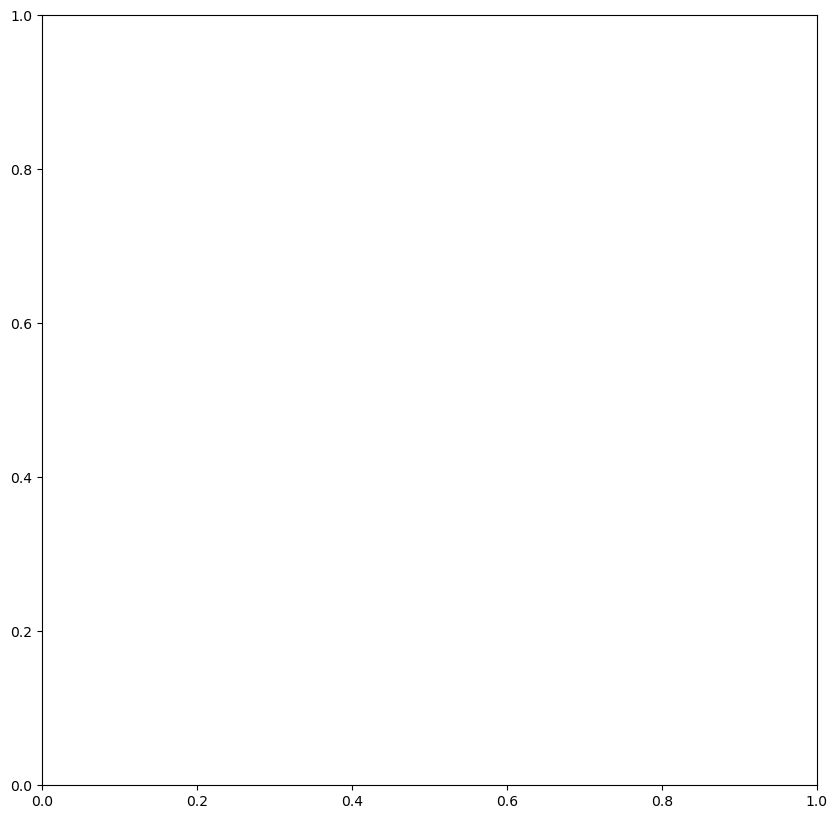

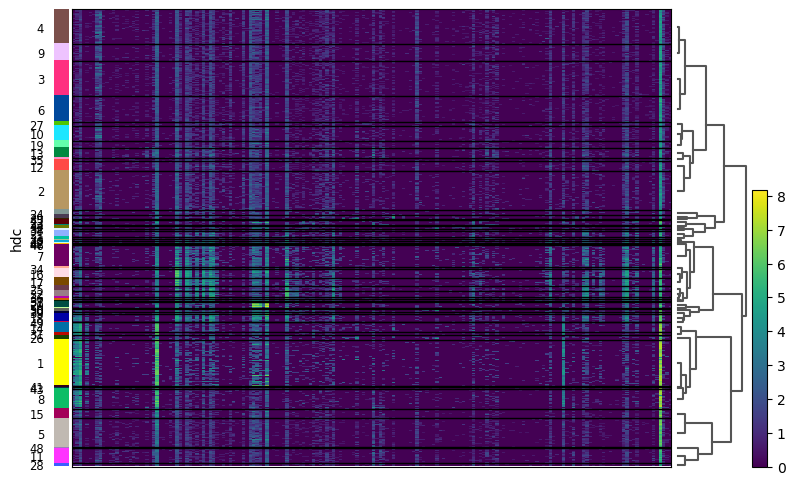

In [388]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
deg_data = hdata[:, deg]
sc.pl.rank_genes_groups_heatmap(deg_data, var_names=deg)

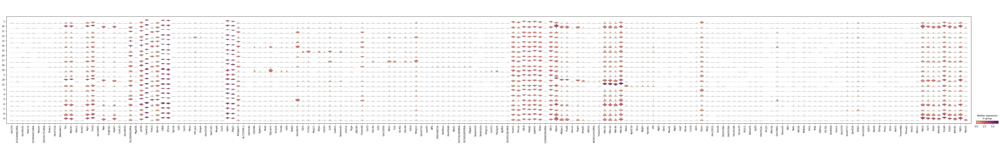

In [116]:
fig, ax = plt.subplots(figsize(20, 10))
sc.pl.stacked_violin(hdata, var_names=deg, groupby='hdc', cmap='flare', ax=ax)

In [68]:
interest_genes = set()
for key in marks.keys():
    for gene in marks[key]: interest_genes.add(gene)
interest_genes = [gene for gene in interest_genes]

In [100]:

# macrophage 30, 50

[]


In [60]:
cdata = tdata.copy()

In [61]:
SCC.scc(cdata, key_added="scc", pca_key="X_pca", resolution=1)

using adj_matrix from arg for clustering...


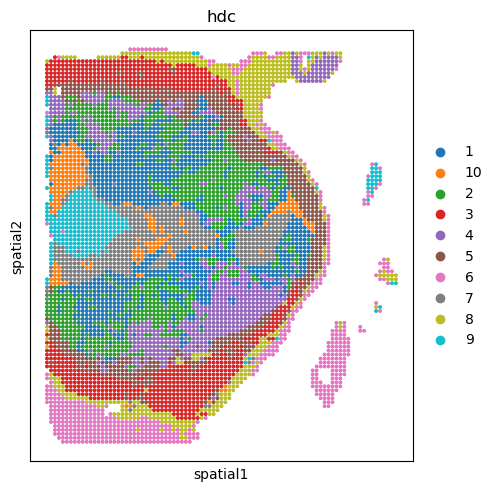

In [308]:
sq.pl.spatial_scatter(cdata, color=["hdc"], size=10, shape=None)

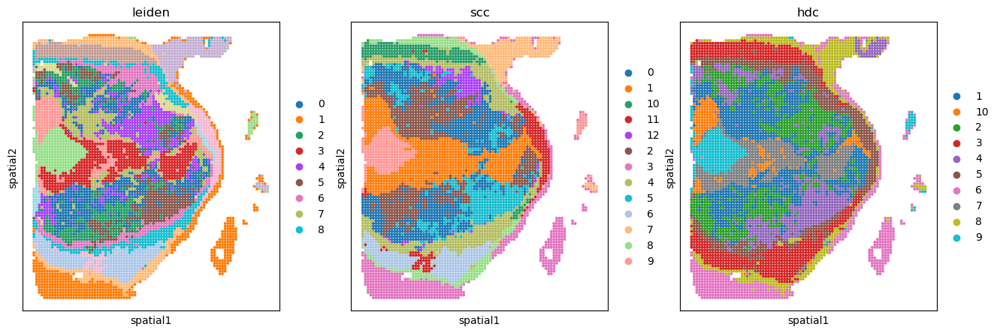

In [63]:
fig, ax = plt.subplots(1, 3, figsize=(16,5))
sq.pl.spatial_scatter(cdata, color=["leiden"], size=10, shape=None, ax=ax[0])
sq.pl.spatial_scatter(cdata, color=["scc"], size=10, shape=None, ax=ax[1])
sq.pl.spatial_scatter(cdata, color=["hdc"], size=10, shape=None, ax=ax[2])

In [93]:
#sc.pl.rank_genes_groups_heatmap(adata, groups="9", n_genes=10, groupby="scc")
sc.tl.rank_genes_groups(cdata, groupby="hdc", method="t-test")

In [94]:
result = cdata.uns['rank_genes_groups']
groups = result['names'].dtype.names

# 提取高变基因和其Log2FC，存储到DataFrame
all_genes = pd.DataFrame(
    {group + '_' + key: result[key][group]
     for group in groups for key in ['names', 'pvals']}
)

group_id = '1'
selected_genes = pd.DataFrame({
    'names': all_genes[group_id + '_names'],
    'pvals': all_genes[group_id + '_pvals']
})
selected_genes_sorted = selected_genes.sort_values(by='pvals', ascending=True)

print(selected_genes_sorted.head(n=10))  # 打印Log2FC最高的几个基因

               names  pvals
33             Aebp1    0.0
24500          Kpna1    0.0
24501         Il31ra    0.0
24502        Gm19951    0.0
24503         Camk1d    0.0
24504  D130009I18Rik    0.0
24505           Cdk8    0.0
24506         Jarid2    0.0
9              Rps28    0.0
34          Serpinh1    0.0


In [6]:
from sklearn.linear_model import ElasticNet
from sklearn.datasets import make_regression
from sklearn.model_selection import GridSearchCV
from tqdm import tqdm
from scipy.stats import pearsonr
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
import seaborn as sns

In [51]:
g_cells = [tuple(array) for array in sgdata.obsm['spatial']]
t_cells = [tuple(array) for array in hdata.obsm['spatial']]
cells_to_keep = [True if cell in t_cells else False for cell in g_cells]

#sgdata = gdata[~np.isin(gdata.obsm['spatial'], cells_to_remove), :].copy()
cgdata = sgdata[cells_to_keep, :].copy()

guide_expression = cgdata.X
ntc_expression = cgdata[:, "sgnon-targeting"].X.flatten()
guide_matrix = np.zeros([len(guide_expression.T), len(guide_expression)])
for i in range(len(guide_expression.T)):
    #guide_matrix[i] = guide_expression.T[i]
    #guide_matrix[i] = guide_expression.T[i] - ntc_expression
    guide_matrix[i] = np.log2(guide_expression.T[i] + 1e-9) - np.log2(ntc_expression + 1e-9)
guide_matrix

array([[  0.        ,   0.        , -29.89735286, ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        , -29.89735286, ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        , -29.89735286, ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [  0.        ,   0.        , -29.89735286, ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        , -29.89735286, ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ]])

In [39]:
cgdata.write_h5ad("./gRNA/D03658A3.filtered_hk.bin_100.h5")

In [26]:
clusters = np.unique(hdata.obs["hdc"])
corr_matrix = np.zeros((len(cgdata.var_names), len(clusters)))
for ic, cluster in tqdm(enumerate(clusters)):
    interests = top_genes_df.loc[top_genes_df["Cluster"] == cluster, "Gene"]
    sc.tl.score_genes(hdata, gene_list=interests, score_name=f"cluster_{cluster}_score")
    
    for ig, sgene in enumerate(cgdata.var_names):
        sg_vec = guide_matrix[ig]
        if sgene != "sgnon-targeting":
            h_vec = hdata.obs[f"cluster_{cluster}_score"]
            corr_matrix[ig, ic] = pearsonr(sg_vec, h_vec)[0]

18it [00:41,  2.32s/it]


/tmp/ipykernel_11996/1870684053.py:5: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
/tmp/ipykernel_11996/1870684053.py:8: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z_gRNA = linkage(distance_matrix_gRNA, method='ward')


<Axes: >

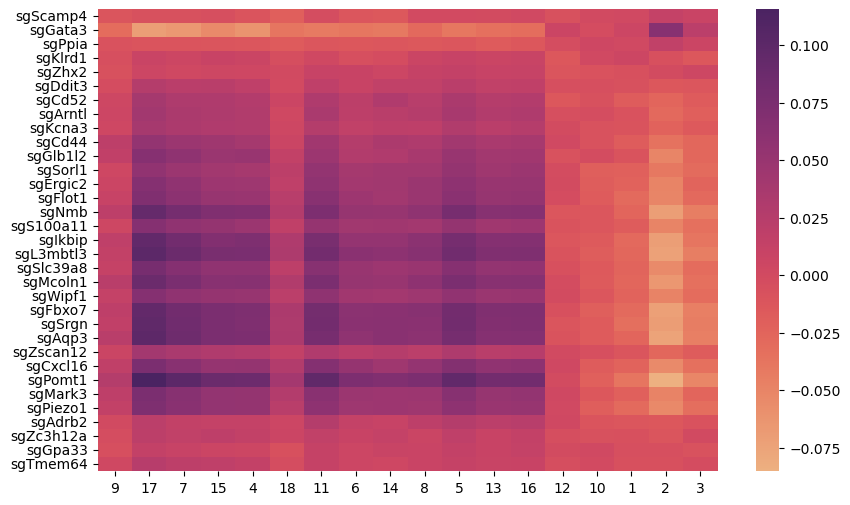

In [211]:
fig, ax = plt.subplots(figsize=(10, 6))
corr_df = pd.DataFrame(corr_matrix, columns=clusters, index=cgdata.var_names).iloc[:-1, :]

distance_matrix_gRNA = 1 - corr_df.T.corr()
Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
gRNA_order = leaves_list(Z_gRNA)
distance_matrix_gRNA = 1 - corr_df.corr()
Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
RNA_order = leaves_list(Z_gRNA)

corr_df = corr_df.iloc[gRNA_order, RNA_order]
#sns.heatmap(corr_df, cmap="flare", yticklabels=cgdata.var_names[:-1], xticklabels=clusters, ax=ax)
sns.heatmap(corr_df, cmap="flare", yticklabels=corr_df.index, xticklabels=corr_df.columns, ax=ax)

In [69]:
#interest_genes = deg
genes = sgdata.var_names
corr_matrix = np.zeros((len(interest_genes), len(genes)))
print(len(interest_genes))
for id, d in tqdm(enumerate(interest_genes)):
    h_vec = hdata[:, d].X.toarray().flatten()
    for ig, g in enumerate(genes):
        corr = pearsonr(h_vec, guide_matrix[ig])[0]
        corr_matrix[id, ig] = corr

236


0it [00:00, ?it/s]

/tmp/ipykernel_47434/4054646226.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr = pearsonr(h_vec, guide_matrix[ig])[0]
236it [00:46,  5.05it/s]


/tmp/ipykernel_47434/811767780.py:13: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
/tmp/ipykernel_47434/811767780.py:16: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  Z_gRNA = linkage(distance_matrix_gRNA, method='ward')


Text(0.5, 1.0, 'Top/Least 5 Hallmarks/Signature correlation with L2FC(Guide/NTC)')

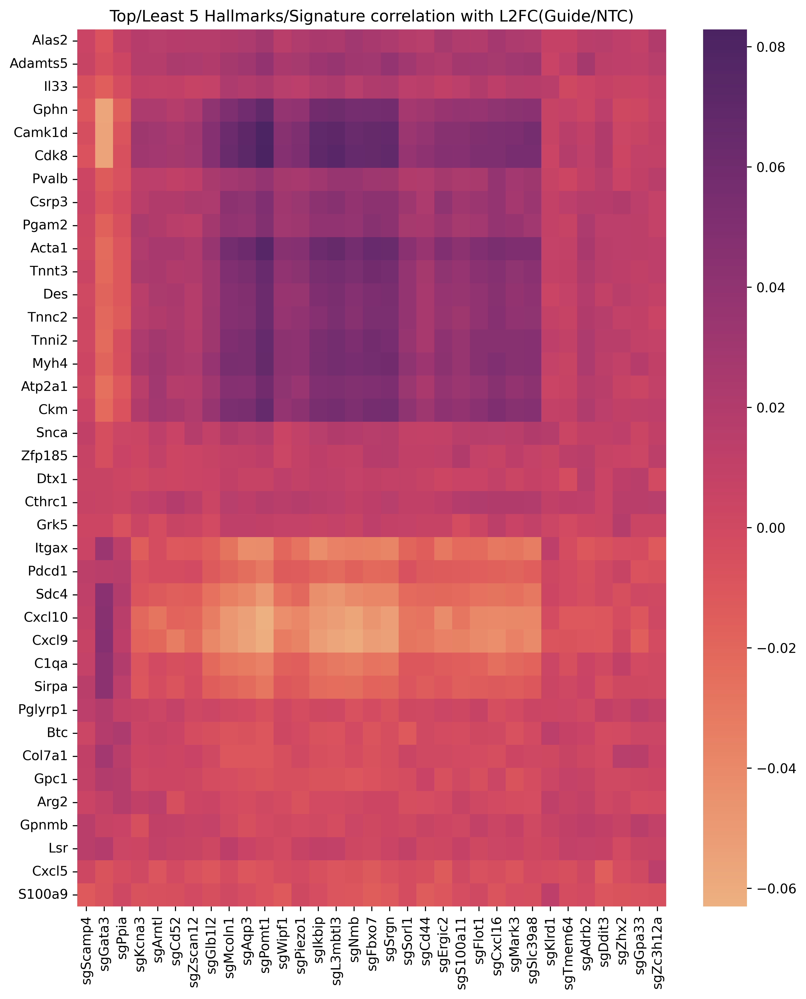

In [70]:
corr_df = pd.DataFrame(corr_matrix.T, columns=interest_genes, index=cgdata.var_names).iloc[:-1,:]
interests = []
for ig, g in enumerate(cgdata.var_names[:-1]):
    t = corr_df.iloc[ig, :].sort_values(ascending=False)
    interests += [gene for gene in t.index[:5]]
    t = corr_df.iloc[ig, :].sort_values(ascending=True)
    interests += [gene for gene in t.index[-5:]]

interests = np.unique(interests)
corr_ = corr_df.loc[:, interests]

distance_matrix_gRNA = 1 - corr_.corr()
Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
gRNA_order = leaves_list(Z_gRNA)
distance_matrix_gRNA = 1 - corr_.T.corr()
Z_gRNA = linkage(distance_matrix_gRNA, method='ward')
RNA_order = leaves_list(Z_gRNA)

corr_ = corr_.iloc[RNA_order,gRNA_order]

fig, ax = plt.subplots(figsize=(10, 12))
sns.heatmap(corr_.T, cmap="flare", xticklabels=corr_.index, yticklabels=corr_.columns, ax=ax)
ax.set_title("Top/Least 5 Hallmarks/Signature correlation with L2FC(Guide/NTC)")

In [98]:
sq.gr.spatial_neighbors(cgdata, coord_type="generic", spatial_key="spatial")
sq.gr.spatial_autocorr(cgdata, mode="moran")
cgdata.uns["moranI"]

,I,pval_norm,var_norm,pval_norm_fdr_bh
sgDdit3,0.047023,0.000000,0.000016,0.000000
sgZc3h12a,0.012211,0.001030,0.000016,0.013313
sgKlrd1,0.012054,0.001175,0.000016,0.013313
sgSorl1,0.010298,0.004651,0.000016,0.039536
sgGata3,0.008125,0.019959,0.000016,0.103505
sgErgic2,0.008082,0.020495,0.000016,0.103505
sgPpia,0.008017,0.021310,0.000016,0.103505
sgGlb1l2,0.007141,0.035360,0.000016,0.150280
sgWipf1,0.006687,0.045221,0.000016,0.156378
sgAqp3,0.006655,0.045994,0.000016,0.156378


In [78]:
param_grid = {
        'alpha': [0.05, 0.1, 0.5, 1],
        'l1_ratio': [0.05, 0.1, 0.5, 1]
}
hvg_matrix = hdata[:, interest_genes].X.toarray()
genes = cgdata.var_names
res_vec = {}
for idx, gene in tqdm(enumerate(genes)):
    guide_vec = guide_matrix[idx].reshape(-1, 1)
    
    regr = ElasticNet(random_state=0, alpha=1, l1_ratio=0.05)
    
    #grid_search = GridSearchCV(regr, param_grid, cv=5, scoring='neg_mean_squared_error')
    #grid_search.fit(guide_vec, hvg_matrix)
    #best_regr = grid_search.best_estimator_

    regr.fit(guide_vec, hvg_matrix)
    res_vec[gene] = regr.coef_.flatten()
    #print(best_regr)
    print(gene, np.sum(regr.coef_))
    break

0it [00:13, ?it/s]

sgAdrb2 0.01987092319146194


(20093, 1)

In [38]:
genes = cgdata.var_names[:-1]
interests = deg
corr_matrix = np.zeros((len(interests), len(genes)))
expr_matrix = hdata[:, interests].X.toarray()

for i_gene, gene in tqdm(enumerate(genes)):
    guide_vec = guide_matrix[i_gene].reshape(-1, 1)
    
    regr = ElasticNet(random_state=0, alpha=0.05, l1_ratio=0.05)

    regr.fit(guide_vec, expr_matrix)
    corr_matrix[:, i_gene] = regr.coef_.flatten()

11it [05:43, 31.22s/it]


KeyboardInterrupt: 

In [101]:
genes = cgdata.var_names[:-1]
interests = deg
corr_matrix = np.zeros((len(interests), len(genes)))
for i_path, path in enumerate(marks.keys()):
    if f"{path}_score" not in hdata.obs: continue
    hvg_matrix = np.array(hdata.obs[f"{path}_score"]).reshape(-1, 1)
    for i_gene, gene in tqdm(enumerate(genes)):
        guide_vec = guide_matrix[i_gene].reshape(-1, 1)
        
        regr = ElasticNet(random_state=0, alpha=0.05, l1_ratio=0.05)

        regr.fit(guide_vec, hvg_matrix)
        corr_matrix[i_path, i_gene] = regr.coef_[0]

34it [00:00, 430.44it/s]
34it [00:00, 539.76it/s]
34it [00:00, 273.71it/s]
34it [00:00, 403.58it/s]
34it [00:00, 526.43it/s]
34it [00:00, 525.04it/s]
34it [00:00, 530.29it/s]
34it [00:00, 544.26it/s]
34it [00:00, 545.91it/s]
34it [00:00, 135.80it/s]
34it [00:00, 435.79it/s]
34it [00:00, 534.04it/s]
34it [00:00, 530.98it/s]
34it [00:00, 529.41it/s]
34it [00:00, 506.99it/s]
34it [00:00, 538.45it/s]
34it [00:00, 556.00it/s]
34it [00:00, 454.35it/s]
34it [00:00, 432.13it/s]
34it [00:00, 652.68it/s]
34it [00:00, 649.16it/s]
34it [00:00, 748.89it/s]
34it [00:00, 756.77it/s]
34it [00:00, 760.12it/s]
34it [00:00, 751.26it/s]
34it [00:00, 758.08it/s]
34it [00:00, 747.53it/s]
34it [00:00, 788.89it/s]
34it [00:00, 762.64it/s]
34it [00:00, 760.76it/s]
34it [00:00, 739.81it/s]
34it [00:00, 779.66it/s]
34it [00:00, 751.23it/s]
34it [00:00, 788.47it/s]
34it [00:00, 767.56it/s]
34it [00:00, 788.91it/s]
34it [00:00, 794.40it/s]
34it [00:00, 768.40it/s]
34it [00:00, 784.29it/s]
34it [00:00, 769.67it/s]


<Axes: >

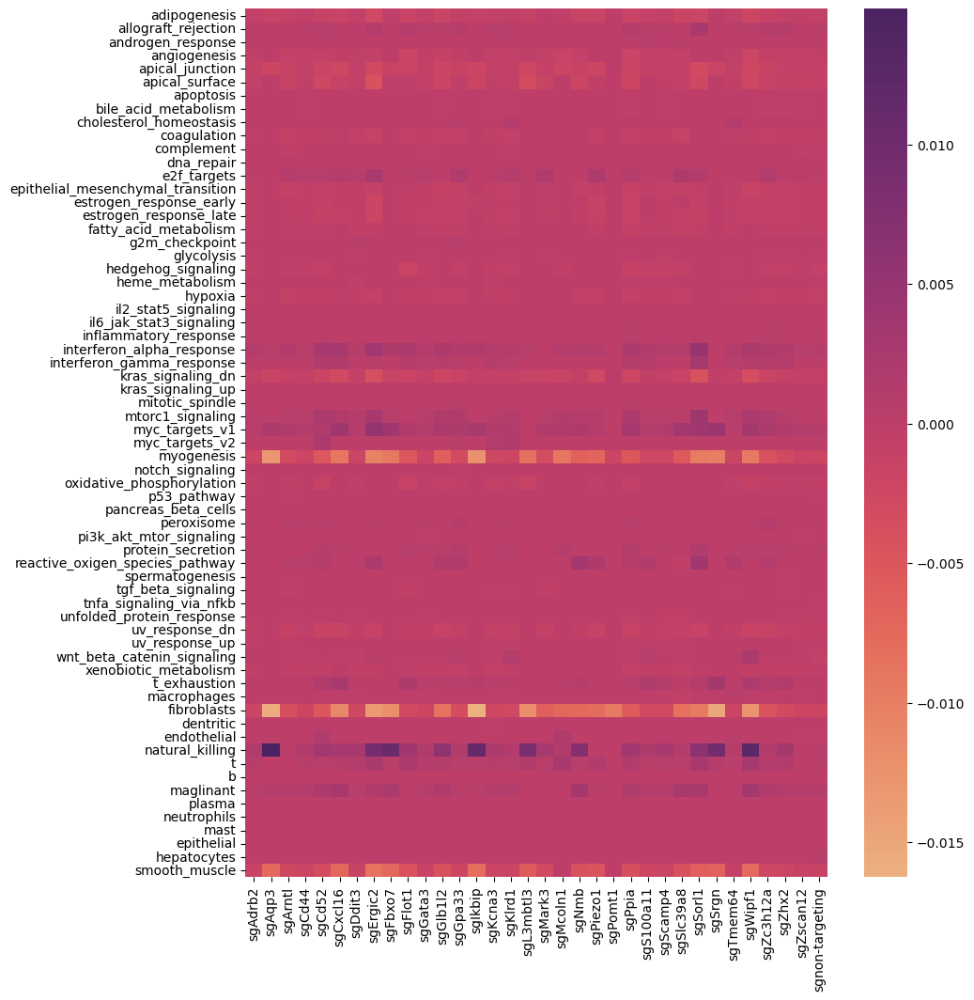

In [142]:
fig, ax = plt.subplots(figsize=(10, 12))
sns.heatmap(corr_matrix, cmap="flare", xticklabels=cgdata.var_names, yticklabels=marks.keys(), ax=ax)

In [47]:
%config InlineBackend.figure_format = 'png'
%config InlineBackend.print_figure_kwargs = {'dpi': 600}

In [1]:
return
for idx, sgene in tqdm(enumerate(cgdata.var_names)):

    if sgene == "sgnon-targeting": continue

    fig, ax = plt.subplots(1, 1)

    x = cgdata.obsm["spatial"][:, 0]
    y = cgdata.obsm["spatial"][:, 1]
    a = (cgdata[:,"sgnon-targeting"].X.flatten()).tolist()
    b = (cgdata[:, sgene].X.flatten()).tolist()

    if sgene.lstrip('sg') in hdata.var_names:
        sq.pl.spatial_scatter(hdata, color=[sgene.lstrip('sg')], size=2, shape=None, ax=ax, library_id="gRNA")
        ax.set_title(f"{sgene} vs NTC")
    else:
        sq.pl.spatial_scatter(hdata, color=["t_score"], size=2, shape=None, ax=ax, library_id="gRNA")
        ax.set_title(f"{sgene} vs NTC <T score>")
    ax.scatter(x, y, s=a, alpha=0.8, color="#FFFFFF")
    ax.scatter(x, y, s=b, alpha=0.6, color="#FF9900")

SyntaxError: 'return' outside function (2413225456.py, line 1)

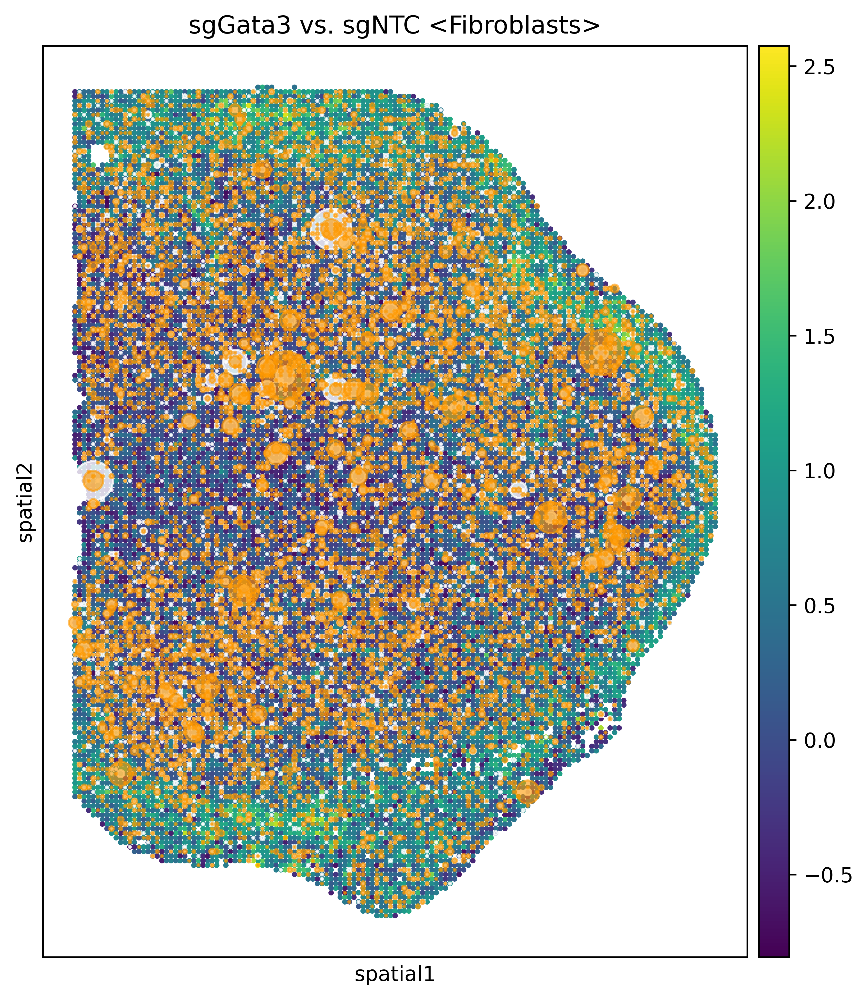

In [75]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

x = cgdata.obsm["spatial"][:, 0]
y = cgdata.obsm["spatial"][:, 1]
a = (cgdata[:,"sgnon-targeting"].X.flatten()).tolist()
b = (cgdata[:,"sgGata3"].X.flatten()).tolist()

sq.pl.spatial_scatter(hdata, color=["fibroblasts_score"], size=10, shape=None, ax=ax)
ax.scatter(x, y, s=a, alpha=0.8, color="#FFFFFF")
ax.scatter(x, y, s=b, alpha=0.6, color="#FF9900")
ax.set_title("sgGata3 vs. sgNTC <Fibroblasts>")
plt.show()

In [80]:
matrix = np.zeros((34, 34))
for i, igene in enumerate(genes):
    for j, jgene in enumerate(genes):
        matrix[i, j] = pearsonr(res_vec[igene], res_vec[jgene])[0]

mask = np.isfinite(matrix)
matrix = np.where(mask, matrix, 0)

for i, _ in enumerate(genes):
    matrix[i, i] = 1

dist = 1 - np.abs(matrix)
linkage_matrix = linkage(squareform(dist), method="average")
dendro = dendrogram(linkage_matrix, no_plot=True)
order = dendro["leaves"]

matrix = matrix[order, :]
matrix = matrix[:, order]

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(matrix, cmap="flare", xticklabels=np.array(genes)[order], yticklabels=np.array(genes)[order], ax=ax)
#cbar = ax.figure.colorbar(im, ax=ax)

#ax.set_xticks(np.arange(matrix.shape[1]))
#ax.set_yticks(np.arange(matrix.shape[0]))

ax.set_yticklabels(sgdata.var_names)
ax.set_xticklabels(sgdata.var_names, rotation=90)

ax.set_title("pearson score")
plt.show()

ValueError: x and y must have length at least 2.

In [285]:
top_genes_df

,Gene,Log2FoldChange,padj,Cluster
0,Gm44702,1.961101,0.008375,1
1,Ibsp,1.742968,0.000558,1
2,Rnf223,1.584924,0.005659,1
3,Gldnos,1.523006,0.004976,1
4,Gm36543,1.519755,0.006222,1
...,...,...,...,...
2995,Gtf2i,-0.346068,0.003197,9
2996,Khdrbs1,-0.346691,0.000049,9
2997,Trim25,-0.346906,0.000021,9
2998,Ppp1r21,-0.347684,0.009645,9


In [300]:
# divide cluster

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


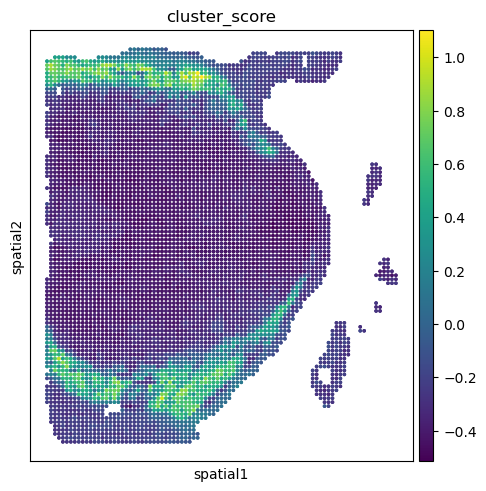

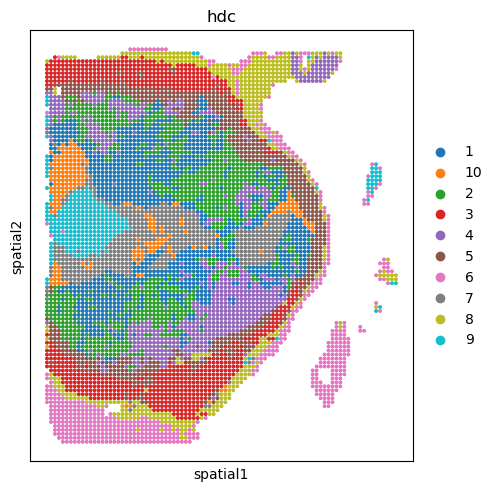

In [307]:
cluster = "3"
cluster_genes = top_genes_df.loc[top_genes_df["Cluster"] == cluster]["Gene"].tolist()
sc.tl.score_genes(fdata, gene_list=cluster_genes, score_name="cluster_score")
sq.pl.spatial_scatter(fdata, color=["cluster_score"], size=10, shape=None)
sq.pl.spatial_scatter(fdata, color=["hdc"], size=10, shape=None)

In [267]:
dendro["ivl"]

['21',
 '1',
 '7',
 '13',
 '8',
 '27',
 '6',
 '18',
 '16',
 '29',
 '11',
 '3',
 '19',
 '26',
 '5',
 '17',
 '23',
 '25',
 '20',
 '9',
 '30',
 '31',
 '2',
 '4',
 '14',
 '15',
 '28',
 '12',
 '0',
 '32',
 '24',
 '33',
 '10',
 '22']

In [118]:
groups = cdata.uns["rank_genes_groups"]["names"].dtype.names
all_high_var_genes = pd.DataFrame()
for group in groups:
    genes = result['names'][group]
    pvals = result['pvals_adj'][group]
    subset = pd.DataFrame({
        'gene': genes,
        'pval': pvals,
        'group': group
    })
    all_high_var_genes = pd.concat([all_high_var_genes, subset[subset['pval'] < 0.05]])

# 去重，因为同一基因可能在多个类别中被标记为高变
all_high_var_genes = all_high_var_genes.drop_duplicates(subset='gene')

('0', '1', '10', '11', '2', '3', '4', '5', '6', '7', '8', '9')

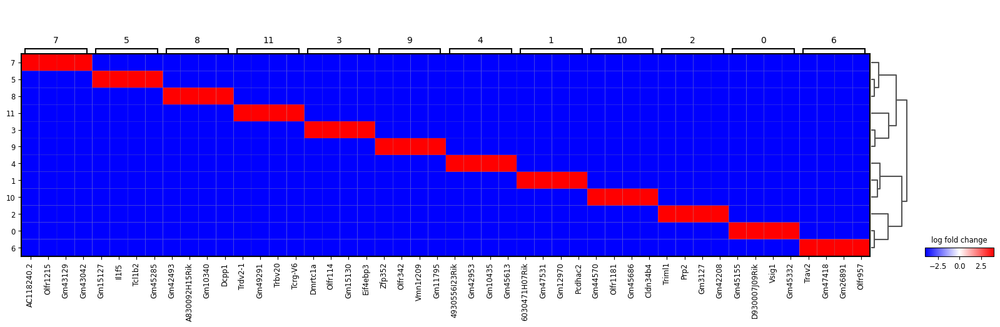

In [107]:
sc.pl.rank_genes_groups_matrixplot(
    cdata,
    n_genes=4,
    groupby="scc",
    values_to_plot="logfoldchanges",
    cmap='bwr',
    vmin=-4,
    vmax=4,
    min_logfoldchange=10,
    colorbar_title='log fold change',
)

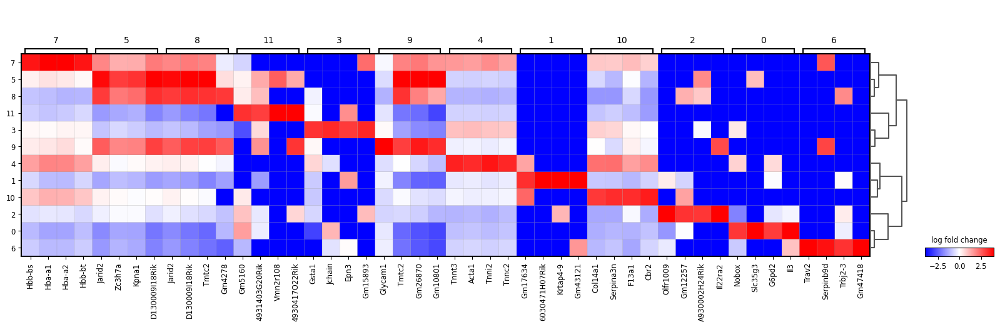

In [108]:
sc.pl.rank_genes_groups_matrixplot(
    cdata,
    n_genes=4,
    groupby="scc",
    values_to_plot="logfoldchanges",
    cmap='bwr',
    vmin=-4,
    vmax=4,
    min_logfoldchange=3,
    colorbar_title='log fold change',
)